# DATA ANALYSIS INTERN @COGNIFYZ

## AUTHOR : RITIKA ROY CHOWDHURY


In [2]:
import pandas as pd

# Step 1: Load the dataset
data = pd.read_csv("Downloads/Dataset.csv")  

In [3]:
# Step 2: Explore the dataset
data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [4]:
# Step 3: Data Preprocessing 
data.isna().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

### LEVEL 1- TASK 1 : TOP CUISINES

In [5]:
# Step 4: Count Cuisines
cuisine_counts = data['Cuisines'].value_counts()

# Step 5: Identify the Top Three Cuisines
top_three_cuisines = cuisine_counts.nlargest(3)

# Step 6: Calculate the Percentage
total_restaurants = len(data)
percentage_top_cuisines = (top_three_cuisines / total_restaurants) * 100

print("Top Three Cuisines:")
print(top_three_cuisines)

print("\nPercentage of Restaurants Serving Each Top Cuisine:")
print(percentage_top_cuisines)


Top Three Cuisines:
North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: Cuisines, dtype: int64

Percentage of Restaurants Serving Each Top Cuisine:
North Indian             9.800021
North Indian, Chinese    5.350225
Chinese                  3.706418
Name: Cuisines, dtype: float64


### LEVEL 1- TASK 2 : CITY ANALYSIS

In [7]:
# Identify the city with the highest number of restaurants
city_with_most_restaurants = data['City'].value_counts().idxmax()

# Calculate the average rating for restaurants in each city
average_ratings_by_city = data.groupby('City')['Aggregate rating'].mean()

# Determine the city with the highest average rating
city_highest_average_rating = average_ratings_by_city.idxmax()

# Print the results
print("City with the highest number of restaurants:", city_with_most_restaurants)
print("\nAverage rating for restaurants in each city:")
print(average_ratings_by_city)
print("\nCity with the highest average rating:", city_highest_average_rating)

City with the highest number of restaurants: New Delhi

Average rating for restaurants in each city:
City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64

City with the highest average rating: Inner City


### LEVEL 1 - TASK 3 : PRICE RANGE DISTRIBUTION

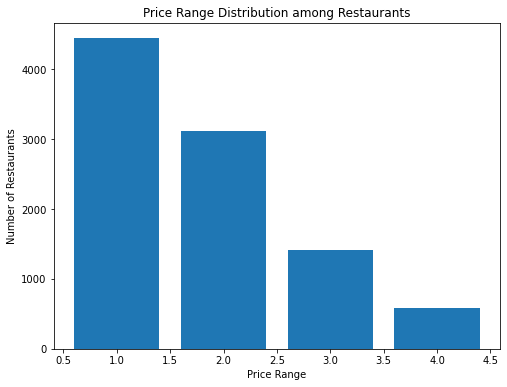

In [9]:
import matplotlib.pyplot as plt
#Create a histogram or bar chart to visualize the distribution of price ranges
price_range_counts = data['Price range'].value_counts()

# Plotting the histogram/bar chart
plt.figure(figsize=(8, 6))
plt.bar(price_range_counts.index, price_range_counts.values)
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.title('Price Range Distribution among Restaurants')
plt.show()

In [10]:
# Calculate the percentage of restaurants in each price range category
total_restaurants = len(data)
percentage_per_price_range = (price_range_counts / total_restaurants) * 100

print("Percentage of Restaurants in Each Price Range Category:")
print(percentage_per_price_range)

Percentage of Restaurants in Each Price Range Category:
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: Price range, dtype: float64


### LEVEL 1 - TASK 4 : ONLINE DELIVERY

Percentage of Restaurants that Offer Online Delivery: 25.66%
Average Rating of Restaurants with Online Delivery: 3.2488372093023306
Average Rating of Restaurants without Online Delivery: 2.465295774647888


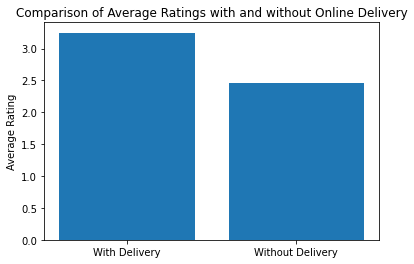

In [13]:
# Determine the percentage of restaurants that offer online delivery
restaurants_with_delivery = data[data['Has Online delivery'] == 'Yes']
percentage_with_delivery = (len(restaurants_with_delivery) / len(data)) * 100

print("Percentage of Restaurants that Offer Online Delivery: {:.2f}%".format(percentage_with_delivery))

# Compare the average ratings of restaurants with and without online delivery
average_rating_with_delivery = restaurants_with_delivery['Aggregate rating'].mean()

restaurants_without_delivery = data[data['Has Online delivery'] == 'No']
average_rating_without_delivery = restaurants_without_delivery['Aggregate rating'].mean()

print("Average Rating of Restaurants with Online Delivery:", average_rating_with_delivery)
print("Average Rating of Restaurants without Online Delivery:", average_rating_without_delivery)

# Step 4: Create a bar chart to visualize the comparison (optional)
plt.bar(['With Delivery', 'Without Delivery'], [average_rating_with_delivery, average_rating_without_delivery])
plt.ylabel('Average Rating')
plt.title('Comparison of Average Ratings with and without Online Delivery')
plt.show()

### LEVEL 2- TASK 1 : RESTAURANT RATINGS

In [17]:
#Analyze the distribution of aggregate ratings and determine the most common rating range
rating_counts = data['Aggregate rating'].value_counts()
rating_counts


0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: Aggregate rating, dtype: int64

In [18]:
most_common_rating = rating_counts.idxmax()

print("Most Common Rating Range:", most_common_rating)

Most Common Rating Range: 0.0


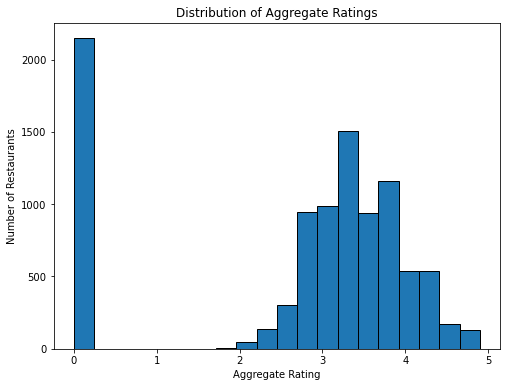

In [19]:
# Create a histogram to visualize the distribution of aggregate ratings
plt.figure(figsize=(8, 6))
plt.hist(data['Aggregate rating'], bins=20, edgecolor='black')
plt.xlabel('Aggregate Rating')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Aggregate Ratings')
plt.show()

In [21]:
#Calculate the average number of votes received by restaurants
average_votes = data['Votes'].mean()
average_votes

156.909747670401

### LEVEL 2 - TASK 2: CUISINE COMBINATION

In [22]:
import seaborn as sns

In [25]:
# Extract and count the combinations of cuisines
# Convert cuisine_column values to strings and then split the cuisines
data['Cuisines'] = data['Cuisines'].astype(str)
cuisine_combinations = data['Cuisines'].str.split(',').apply(frozenset)
cuisine_counts = cuisine_combinations.value_counts()

# Identify the most common combinations of cuisines
most_common_cuisine_combinations = cuisine_counts.nlargest(10)

print("Most Common Cuisine Combinations:")
print(most_common_cuisine_combinations)

Most Common Cuisine Combinations:
(North Indian)                        936
( Chinese, North Indian)              511
(Chinese)                             354
(Fast Food)                           354
(North Indian,  Mughlai)              335
(Cafe)                                299
( Chinese, North Indian,  Mughlai)    267
(Bakery)                              218
( Desserts, Bakery)                   170
(Street Food)                         149
Name: Cuisines, dtype: int64


In [30]:
# Determine if certain cuisine combinations tend to have higher ratings
# Group data by cuisine combinations and calculate the average rating for each group
average_rating_by_cuisine_combination = data.groupby(cuisine_combinations)['Aggregate rating'].mean().sort_values(ascending=False)
average_rating_by_cuisine_combination

Cuisines
( Bakery,  Continental, Italian)    4.9
(Continental,  Indian)              4.9
( Indonesian, Sunda)                4.9
(World Cuisine)                     4.9
( Contemporary, European)           4.9
                                   ... 
( North Indian, Afghani)            0.0
( Fast Food, Juices)                0.0
(Awadhi)                            0.0
( Healthy Food, Bakery)             0.0
(Brazilian,  Mineira)               0.0
Name: Aggregate rating, Length: 1634, dtype: float64

In [32]:
average_rating_by_cuisine_combination.head(10)

Cuisines
( Bakery,  Continental, Italian)    4.9
(Continental,  Indian)              4.9
( Indonesian, Sunda)                4.9
(World Cuisine)                     4.9
( Contemporary, European)           4.9
( Burger,  Grill, American)         4.9
(European,  German)                 4.9
( Deli, Italian)                    4.9
( Bar Food, Burger,  Steak)         4.9
(American,  Sandwich,  BBQ)         4.9
Name: Aggregate rating, dtype: float64

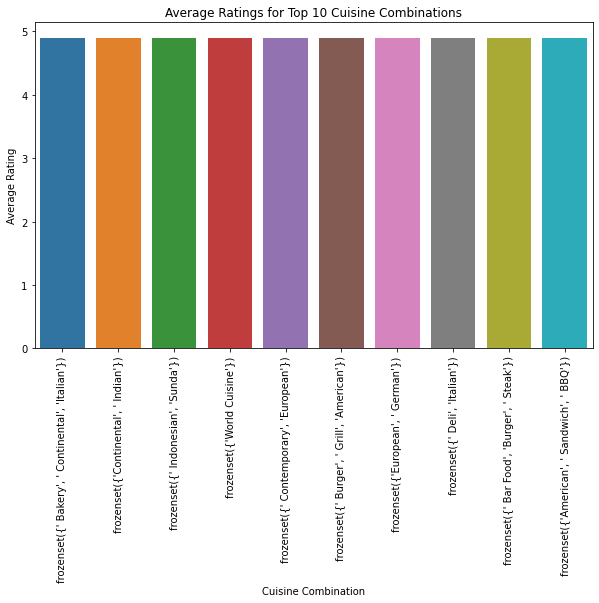

In [33]:
# Plotting the average ratings for the top 10 cuisine combinations
plt.figure(figsize=(10, 6))
sns.barplot(x=average_rating_by_cuisine_combination.head(10).index, y=average_rating_by_cuisine_combination.head(10).values)
plt.xticks(rotation=90)
plt.xlabel('Cuisine Combination')
plt.ylabel('Average Rating')
plt.title('Average Ratings for Top 10 Cuisine Combinations')
plt.show()

### LEVEL 2 - TASK 3 : GEOGRAPHIC ANALYSIS

In [34]:
pip install pandas matplotlib folium

In [38]:
import folium
# Extract the longitude and latitude coordinates
locations = data[['Latitude', 'Longitude']]

# Step 3: Create a map and add markers for each restaurant location
restaurant_map = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=12)

for _, row in locations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup='Restaurant',
        icon=folium.Icon(icon='cutlery', prefix='fa')
    ).add_to(restaurant_map)

# Save the map as an HTML file
restaurant_map.save("restaurant_locations_map.html")


In [42]:
restaurant_map

### LEVEL 2- TASK 4 : RESTAURANT CHAINS

In [44]:
# Identify restaurant chains present in the dataset
# You can consider a restaurant chain if the name appears more than once in the dataset
restaurant_chains = data['Restaurant Name'].value_counts()
chains = restaurant_chains[restaurant_chains > 1].index.tolist()

print("Restaurant Chains in the Dataset:")
print(chains)


Restaurant Chains in the Dataset:
['Cafe Coffee Day', "Domino's Pizza", 'Subway', 'Green Chick Chop', "McDonald's", 'Keventers', 'Pizza Hut', 'Giani', 'Baskin Robbins', 'Barbeque Nation', "Giani's", 'Barista', "Dunkin' Donuts", 'Costa Coffee', 'Pind Balluchi', 'Wah Ji Wah', 'Twenty Four Seven', 'Pizza Hut Delivery', 'Sagar Ratna', 'Republic of Chicken', 'KFC', 'Starbucks', 'Chaayos', 'Burger King', "Haldiram's", 'Shree Rathnam', 'Frontier', 'Moti Mahal Delux', 'Bikanervala', 'Aggarwal Sweets', 'Behrouz Biryani', "Karim's", 'Bikaner Sweets', 'Chicago Pizza', 'Apni Rasoi', '34, Chowringhee Lane', 'Wow! Momo', 'Madras Cafe', 'Burger Point', 'Gopala', 'Shama Chicken Corner', "Berco's", "Nirula's Ice Cream", 'Sardar A Pure Meat Shop', 'Yo! China', 'Cocoberry', 'Punjabi Tadka', 'Angels in my Kitchen', 'Faasos', 'Ovenstory Pizza', 'Chowringhee', 'Punjabi Chaap Corner', 'Kebab Xpress', 'Nazeer Foods', 'RollsKing', 'Tpot', 'Mocha', 'Dolce Gelato', "Tibb's Frankie", 'The Yellow Chilli', 'Slice o

In [46]:
# Analyze the ratings and popularity of different restaurant chains
# Group data by restaurant chains and calculate average rating and popularity (number of votes)
chains_data = data[data['Restaurant Name'].isin(chains)]
chains_ratings = chains_data.groupby('Restaurant Name')['Aggregate rating'].mean().sort_values(ascending=False)
chains_popularity = chains_data.groupby('Restaurant Name')['Votes'].sum().sort_values(ascending=False)

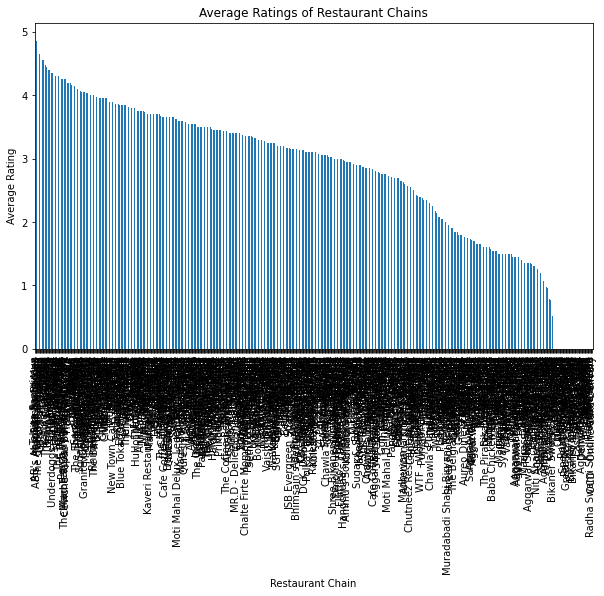

In [47]:
# Plotting the average ratings of restaurant chains
plt.figure(figsize=(10, 6))
chains_ratings.plot(kind='bar')
plt.xlabel('Restaurant Chain')
plt.ylabel('Average Rating')
plt.title('Average Ratings of Restaurant Chains')
plt.xticks(rotation=90)
plt.show()

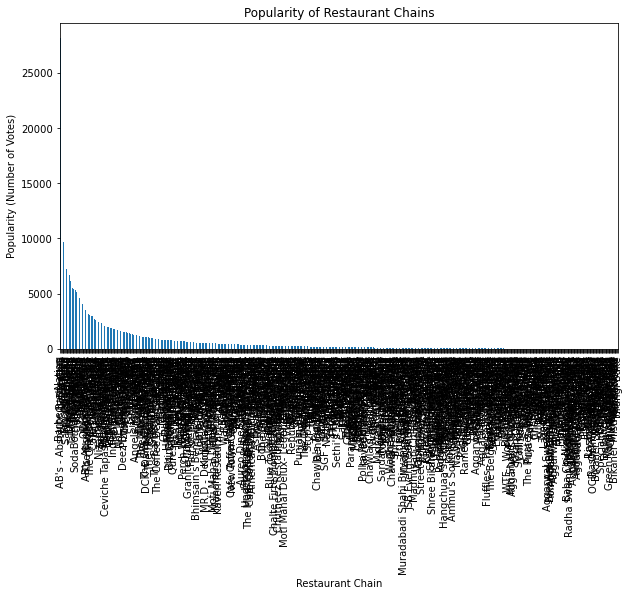

In [48]:
# Plotting the popularity (number of votes) of restaurant chains
plt.figure(figsize=(10, 6))
chains_popularity.plot(kind='bar')
plt.xlabel('Restaurant Chain')
plt.ylabel('Popularity (Number of Votes)')
plt.title('Popularity of Restaurant Chains')
plt.xticks(rotation=90)
plt.show()

### LEVEL 3- TASK 1 : RESTAURANT REVIEWS

In [49]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
import matplotlib.pyplot as plt

# Tokenize the text reviews and remove stopwords and punctuation
nltk.download('punkt')
nltk.download('stopwords')

stop_words = set(stopwords.words('english'))
translator = str.maketrans('', '', string.punctuation)

def process_text(text):
    tokens = word_tokenize(text.lower())
    filtered_tokens = [token.translate(translator) for token in tokens if token.isalpha()]
    filtered_tokens = [token for token in filtered_tokens if token not in stop_words]
    return filtered_tokens

data['processed_reviews'] = data['Rating text'].apply(process_text)

# Identify the most common positive and negative keywords
positive_words = []
negative_words = []

for _, row in data.iterrows():
    if row['Aggregate rating'] >= 4:
        positive_words.extend(row['processed_reviews'])
    elif row['Aggregate rating'] <= 2:
        negative_words.extend(row['processed_reviews'])

positive_word_freq = nltk.FreqDist(positive_words)
negative_word_freq = nltk.FreqDist(negative_words)

print("Most Common Positive Keywords:")
print(positive_word_freq.most_common(10))

print("\nMost Common Negative Keywords:")
print(negative_word_freq.most_common(10))



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


Most Common Positive Keywords:
[('good', 1079), ('excellent', 301)]

Most Common Negative Keywords:
[('rated', 2148), ('poor', 10)]


In [51]:
# Calculate the average length of reviews and explore the relationship with rating
data['review_length'] = data['Rating text'].apply(lambda x: len(word_tokenize(x)))
average_length_by_rating = data.groupby('Aggregate rating')['review_length'].mean()

print("\nAverage Review Length by Rating:")
print(average_length_by_rating)




Average Review Length by Rating:
Aggregate rating
0.0    2.0
1.8    1.0
1.9    1.0
2.0    1.0
2.1    1.0
2.2    1.0
2.3    1.0
2.4    1.0
2.5    1.0
2.6    1.0
2.7    1.0
2.8    1.0
2.9    1.0
3.0    1.0
3.1    1.0
3.2    1.0
3.3    1.0
3.4    1.0
3.5    1.0
3.6    1.0
3.7    1.0
3.8    1.0
3.9    1.0
4.0    2.0
4.1    2.0
4.2    2.0
4.3    2.0
4.4    2.0
4.5    1.0
4.6    1.0
4.7    1.0
4.8    1.0
4.9    1.0
Name: review_length, dtype: float64


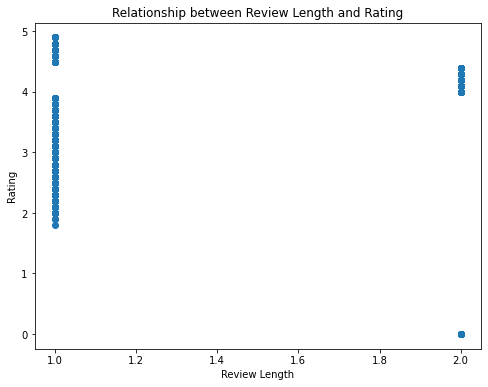

In [53]:
# Plotting the relationship between review length and rating
plt.figure(figsize=(8, 6))
plt.scatter(data['review_length'], data['Aggregate rating'])
plt.xlabel('Review Length')
plt.ylabel('Rating')
plt.title('Relationship between Review Length and Rating')
plt.show()


### LEVEL 3- TASK 2: VOTES ANALYSIS

In [54]:
# Identify the restaurants with the highest and lowest number of votes
highest_votes_restaurant = data.loc[data['Votes'].idxmax()]
lowest_votes_restaurant = data.loc[data['Votes'].idxmin()]

print("Restaurant with the Highest Number of Votes:")
print(highest_votes_restaurant[['Restaurant Name', 'Votes']])

print("\nRestaurant with the Lowest Number of Votes:")
print(lowest_votes_restaurant[['Restaurant Name', 'Votes']])

Restaurant with the Highest Number of Votes:
Restaurant Name     Toit
Votes              10934
Name: 728, dtype: object

Restaurant with the Lowest Number of Votes:
Restaurant Name    Cantinho da Gula
Votes                             0
Name: 69, dtype: object


In [55]:
# Step 3: Analyze the correlation between the number of votes and the rating of a restaurant
correlation = data['Votes'].corr(data['Aggregate rating'])

print("\nCorrelation between Number of Votes and Rating:", correlation)



Correlation between Number of Votes and Rating: 0.3136905841954117


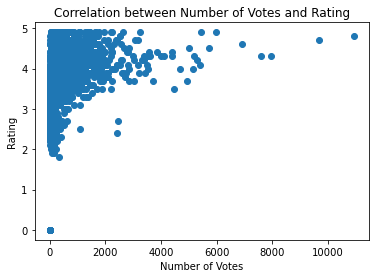

In [56]:
# Plotting the correlation between votes and rating
plt.scatter(data['Votes'], data['Aggregate rating'])
plt.xlabel('Number of Votes')
plt.ylabel('Rating')
plt.title('Correlation between Number of Votes and Rating')
plt.show()

### LEVEL 3 - TASK 3: PRICE RANGE VS. ONLINE DELIVERY AND TABLE BOOKING

In [59]:
# Analyze the relationship between price range and availability of online delivery and table booking
# Step 2: Convert 'Has Online delivery' and 'Has Table booking' columns to numeric types
data['Has Online delivery'] = data['Has Online delivery'].map({'Yes': 0, 'No': 1})
data['Has Table booking'] = data['Has Table booking'].map({'Yes': 0, 'No': 1})
# Create a pivot table to count the number of restaurants in each price range category that offer online delivery and table booking
pivot_table = data.pivot_table(index='Price range', values=['Has Online delivery', 'Has Table booking'], aggfunc='sum')

# Calculate the total number of restaurants in each price range category
total_restaurants = data['Price range'].value_counts()

# Calculate the percentage of restaurants in each price range category that offer online delivery and table booking
pivot_table['percentage_online_delivery'] = (pivot_table['Has Online delivery'] / total_restaurants) * 100
pivot_table['percentage_table_booking'] = (pivot_table['Has Table booking'] / total_restaurants) * 100

print("Relationship between Price Range and Online Delivery (Percentage):")
print(pivot_table[['percentage_online_delivery']])

print("\nRelationship between Price Range and Table Booking (Percentage):")
print(pivot_table[['percentage_table_booking']])

Relationship between Price Range and Online Delivery (Percentage):
             percentage_online_delivery
Price range                            
1                             84.225923
2                             58.689367
3                             70.809659
4                             90.955631

Relationship between Price Range and Table Booking (Percentage):
             percentage_table_booking
Price range                          
1                           99.977498
2                           92.322518
3                           54.261364
4                           53.242321


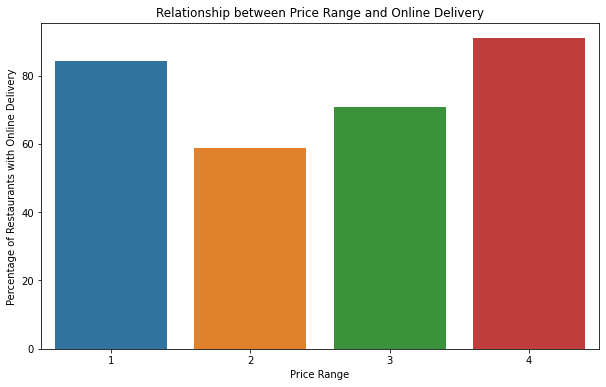

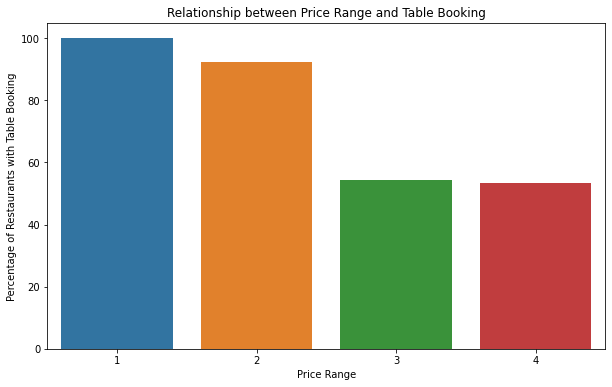

In [60]:
# Plotting the relationship between price range and availability of online delivery and table booking
plt.figure(figsize=(10, 6))
sns.barplot(x=pivot_table.index, y='percentage_online_delivery', data=pivot_table)
plt.xlabel('Price Range')
plt.ylabel('Percentage of Restaurants with Online Delivery')
plt.title('Relationship between Price Range and Online Delivery')
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=pivot_table.index, y='percentage_table_booking', data=pivot_table)
plt.xlabel('Price Range')
plt.ylabel('Percentage of Restaurants with Table Booking')
plt.title('Relationship between Price Range and Table Booking')
plt.show()

# THANK YOU